# Image similarity search with CLIP
This is a notebook that shows how to store vector of CLIP models and build an image similarity search.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [1]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 2.2 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-n3m94wqz
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-n3m94wqz
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369497 sha256=4e2c8455e0579c5aa3c2dd5275116a9f080be850fd312f8494d61ae7650abe05
  Stored in directory: /tmp/pip-ephem-wheel-cache-_iil5mdj/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


In [2]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)


Torch version: 2.1.0+cu118


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [3]:
import clip

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [4]:
model, preprocess = clip.load("ViT-B/32")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 67.8MiB/s]


Model parameters: 151,277,313
Input resolution: 224
Context length: 77
Vocab size: 49408


# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [5]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7e135636ed40>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

# Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [6]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

# Setting up input images and texts

We are going to feed 10 example images from COCO dataset and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [7]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# images in COCO to use and textual descriptions generated by us.
descriptions = {
    "131678323_594a1bd9f9_z": "two men stand nearby a black car",
    "27264220_94192556a1_z": "a bike lies on a beach as a sun sets",
    "3290918536_945aaf04ba_z": "a stop sign ahead",
    "3330877365_42c8d3e29d_z": "a bus passes by a person riding a horse",
    "3440089012_0e580cecc7_z": "a cat sitting on a window",
    "4147178335_af0b4831bf_z": "teddy bears are placed on a bed",
    "5898935548_0221a115a6_z": "a train running beside a lake",
    "6286981167_07746c99a3_z": "a running racehorse",
    "7213399710_5435238cfc_z": "a dog wearing a ribbon",
    "7772698096_c771bbeb34_z": "an airplane of shanghai airlines",
}

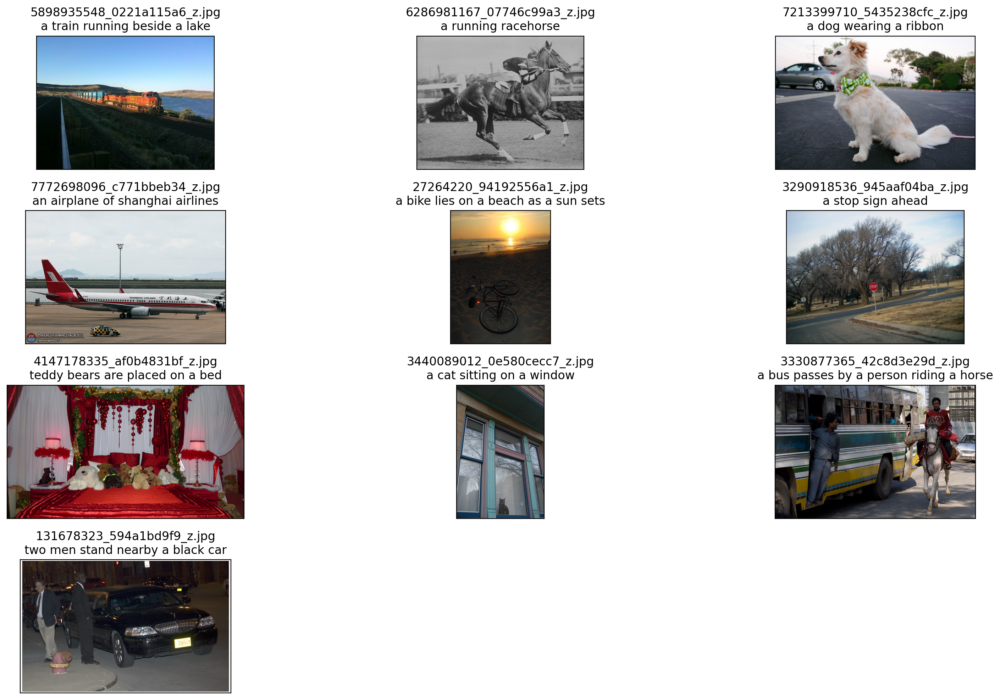

In [8]:
original_images = []
images = []
names = []
texts = []
plt.figure(figsize=(16, 10))

for filename in [filename for filename in os.listdir('/content') if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join('/content', filename)).convert("RGB")

    plt.subplot(4, 3, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    names.append(name)
    texts.append(descriptions[name])

plt.tight_layout()


## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [9]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

In [10]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

In [11]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

Text(0.5, 1.0, 'Cosine similarity between text and image features')

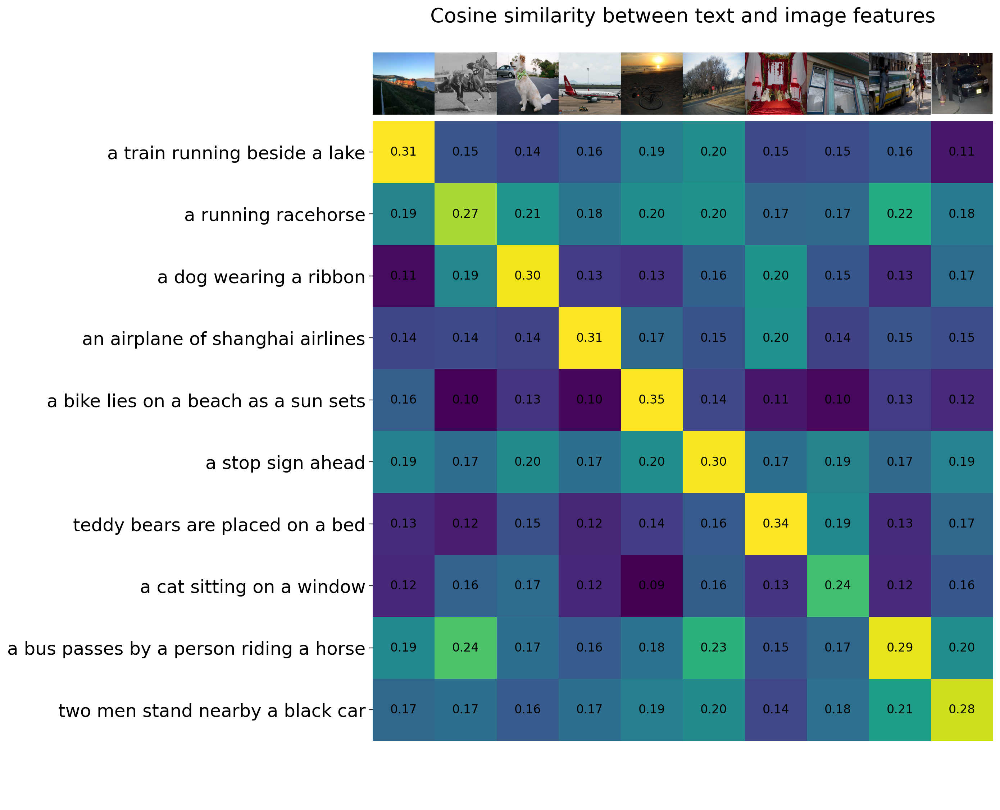

In [12]:
count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=20)

# Zero-Shot Image Classification in COCO dataset (10 classes)


You can classify images using the cosine similarity as the logits to the softmax operation.

In [13]:
classes = ['train', 'horse', 'dog', 'airplane', 'bike', 'stop_sign', 'bed', 'cat', 'bus', 'car']
text_descriptions = [f"This is a photo of a {label}" for label in classes]
text_tokens = clip.tokenize(text_descriptions).cuda()

In [14]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

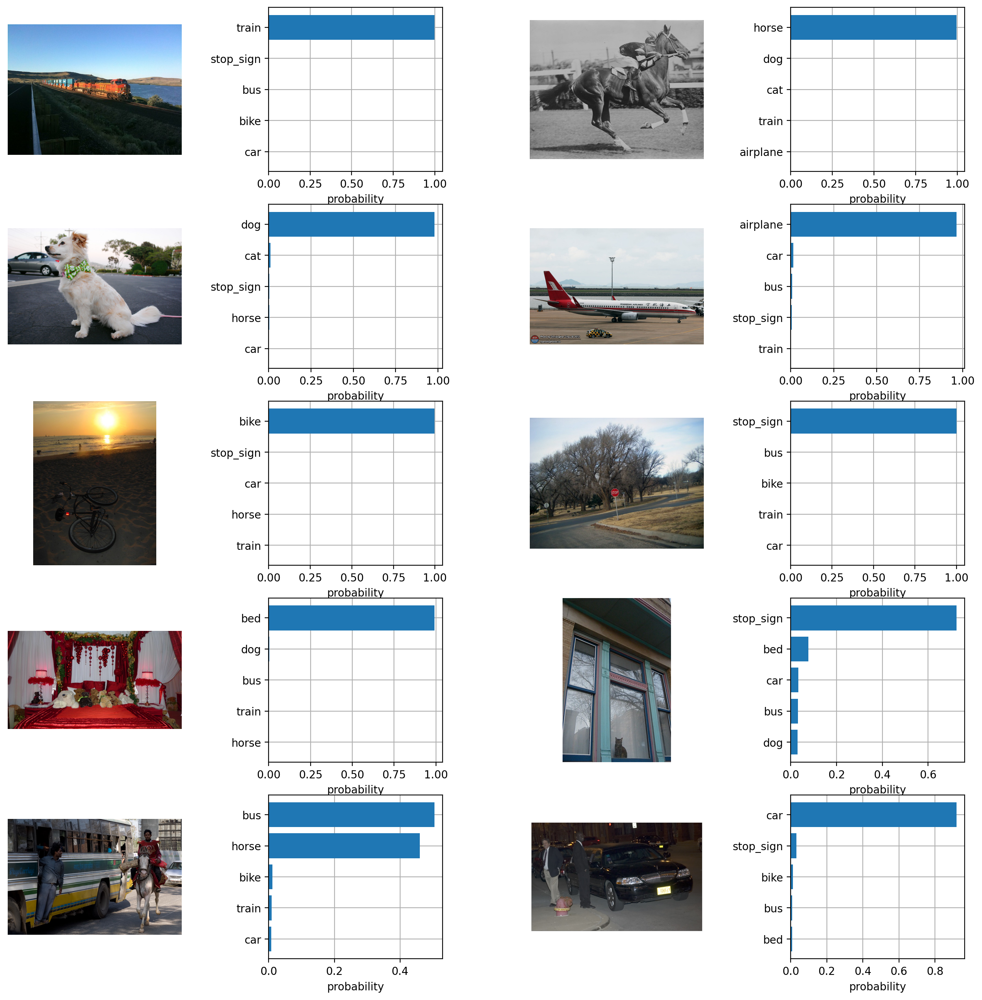

In [15]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(original_images):
    plt.subplot(5, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(5, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

# Vector store using Pinecone

We are going to store vector as a feature of image from CLIP with `pinecone`.

In [16]:
! pip install pinecone-client


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.4/179.4 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.4/300.4 kB 11.0 MB/s eta 0:00:00


## Get and verify your Pinecone API key
If you don't receive an error message, then your API key is valid.

In [18]:
import pinecone

# pinecone.init(api_key="YOUR_API_KEY", environment="YOUR_ENVIRONMENT")
pinecone.list_indexes()

[]

In [21]:
# Create pinecone index with cosine metric
pinecone.create_index('imagesearch-demo', dimension=512, metric='cosine')
index = pinecone.Index('imagesearch-demo')

for i, image_feature in enumerate(image_features):
  index.upsert(vectors=[{'id': names[i], 'values': image_feature.cpu().numpy()}])

In [22]:
# Check index status (a few seconds after upper cell)
index.describe_index_stats()

{'dimension': 512,
 'index_fullness': 0.0001,
 'namespaces': {'': {'vector_count': 10}},
 'total_vector_count': 10}

# Image similarity search using text query

We try to search image by <U>text query</U> from stored vector in index. There are some example of text queries.

We search top-1 image per query.

In [23]:
query_texts = [
    "a person riding a bus",
    "sun set",
    "two men on the side walk",
    "a horse",
    "decorations",
    "a cat"
]

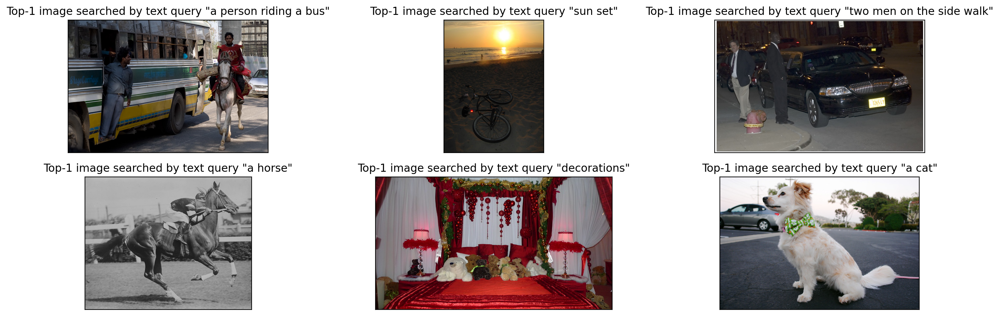

In [24]:
query_tokens = clip.tokenize(['This is ' + desc for desc in query_texts]).cuda()
with torch.no_grad():
  query_features = model.encode_text(query_tokens).float()
query_features /= query_features.norm(dim=-1, keepdim=True)

plt.figure(figsize=(16, 5))
for i, feature in enumerate(query_features):
  search_result = index.query(
      vector=[feature.cpu().tolist()],
      top_k=1,
  )
  result_id = search_result['matches'][0]['id']

  image = original_images[names.index(result_id)]
  plt.subplot(2, 3, i + 1)
  plt.imshow(image)
  plt.title(f"Top-1 image searched by text query \"{query_texts[i]}\"")
  plt.xticks([])
  plt.yticks([])

plt.tight_layout()

# Image similarity search using image query

We try to search image by <U>image query</U> from stored vector in index. There are some example of image queries.

We search top-3 images per query and sort by cosine distance score.

In [25]:
query_image_names = [
    '29215348_4bbafb5dc8_z',
    '4970256058_ed749832e7_z',
    '8881324394_97e0322747_z',
    '9308316038_c0e7e9a6c6_z'
]

In [26]:
original_query_images = []
query_images = []

for image_name in query_image_names:
    image = Image.open(os.path.join('/content', image_name + '.jpg')).convert("RGB")

    original_query_images.append(image)
    query_images.append(preprocess(image))

image_input = torch.tensor(np.stack(query_images)).cuda()

with torch.no_grad():
  image_features = model.encode_image(image_input).float()
image_features /= image_features.norm(dim=-1, keepdim=True)

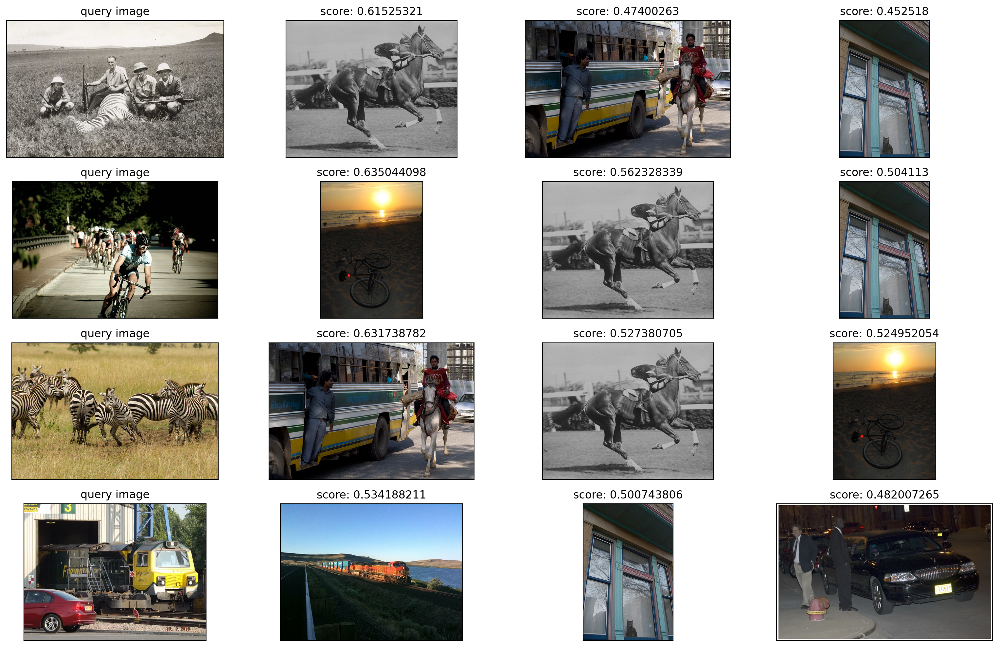

In [27]:
plt.figure(figsize=(16, 10))

for i, feature in enumerate(image_features):
  search_result = index.query(
      vector=[feature.cpu().tolist()],
      top_k=3,
  )

  image = original_query_images[i]

  plt.subplot(4, 4, i * 4 + 1)
  plt.imshow(image)
  plt.title("query image")
  plt.xticks([])
  plt.yticks([])

  for j, result in enumerate(search_result['matches']):

    image = original_images[names.index(result['id'])]

    plt.subplot(4, 4, i * 4 + j + 2)
    plt.imshow(image)
    plt.title(f"score: {result['score']}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

# Delete Pinecone index after demo

In [28]:
pinecone.delete_index('imagesearch-demo')